### Importing Necessary Libraries

In [246]:
import numpy as np
import numpy
import pandas as pd
import seaborn as sns
import os
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
import math
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from datetime import datetime,timedelta

## Loading data from csv files

In [247]:
df_2019=pd.read_csv("POWER_Regional_Daily_20190101_20191231.csv",header=20)
df_2020=pd.read_csv("POWER_Regional_Daily_20200101_20201231.csv",header=20)
df_2021=pd.read_csv("POWER_Regional_Daily_20210101_20211231.csv",header=20)
df_2022=pd.read_csv("POWER_Regional_Daily_20220101_20221231.csv",header=20)
df_2023=pd.read_csv("POWER_Regional_Daily_20230101_20231231.csv",header=20)
df_2024=pd.read_csv("POWER_Regional_Daily_20240101_20240710.csv",header=20)

#### Calculating the date column from Year and DOY

In [248]:
# Function to convert YEAR and DOY to date
def calculate_date(year, doy):
    date = datetime(year, 1, 1) + timedelta(days=doy - 1)
    return date

#### Apply the function to create a new 'Date' column

In [249]:

df_2019['Date'] = df_2019.apply(lambda row: calculate_date(int(row['YEAR']), int(row['DOY'])), axis=1)

df_2020['Date'] = df_2020.apply(lambda row: calculate_date(int(row['YEAR']), int(row['DOY'])), axis=1)
df_2021['Date'] = df_2021.apply(lambda row: calculate_date(int(row['YEAR']), int(row['DOY'])), axis=1)
df_2022['Date'] = df_2022.apply(lambda row: calculate_date(int(row['YEAR']), int(row['DOY'])), axis=1)
df_2023['Date'] = df_2023.apply(lambda row: calculate_date(int(row['YEAR']), int(row['DOY'])), axis=1)
df_2024['Date'] = df_2024.apply(lambda row: calculate_date(int(row['YEAR']), int(row['DOY'])), axis=1)


### Concatenating dataframe to create a single 5 years dataframe from them

In [250]:
data=pd.concat([df_2019,df_2020,df_2021,df_2022,df_2023,df_2024])

In [251]:
all_dates=data['Date']

#### How data looks like

In [252]:
data.head()

,LAT,LON,YEAR,DOY,T2M_RANGE,T2M_MAX,T2M_MIN,QV2M,RH2M,PRECTOTCORR,PS,WS2M,WD10M,TS,T2M,T2MWET,Date
0,38.25,98.25,2019,1,13.45,-11.61,-25.07,0.89,82.29,0.0,60.69,3.48,259.46,-21.67,-20.06,-21.12,2019-01-01
1,38.25,98.75,2019,1,13.19,-11.34,-24.54,0.89,79.72,0.0,60.85,3.55,261.44,-20.54,-19.44,-20.72,2019-01-01
2,38.25,99.25,2019,1,14.01,-9.90,-23.91,0.91,75.09,0.0,62.10,3.27,262.46,-19.51,-18.31,-20.00,2019-01-01
3,38.25,99.75,2019,1,14.27,-7.23,-21.50,0.93,64.30,0.0,64.79,2.63,250.68,-17.08,-15.60,-18.28,2019-01-01
4,38.75,98.25,2019,1,12.79,-10.89,-23.68,0.89,76.70,0.0,61.91,3.06,251.96,-20.15,-18.67,-20.19,2019-01-01


### the number of rows and columns present in our dataset

In [253]:
data.shape

(32288, 17)

### Columns present in our dataset

In [254]:
data.columns

Index(['LAT', 'LON', 'YEAR', 'DOY', 'T2M_RANGE', 'T2M_MAX', 'T2M_MIN', 'QV2M',
       'RH2M', 'PRECTOTCORR', 'PS', 'WS2M', 'WD10M', 'TS', 'T2M', 'T2MWET',
       'Date'],
      dtype='object')

## Data Preprocessing

### 1. Checking the missing values in all columns of the dataset

In [255]:
data.isnull().sum()

LAT            0
LON            0
YEAR           0
DOY            0
T2M_RANGE      0
T2M_MAX        0
T2M_MIN        0
QV2M           0
RH2M           0
PRECTOTCORR    0
PS             0
WS2M           0
WD10M          0
TS             0
T2M            0
T2MWET         0
Date           0
dtype: int64

### Handling missing values if found


In [256]:
data = data.dropna(how='any')

### 2. Checking inconsistencies in the dataset

In [257]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32288 entries, 0 to 3071
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   LAT          32288 non-null  float64       
 1   LON          32288 non-null  float64       
 2   YEAR         32288 non-null  int64         
 3   DOY          32288 non-null  int64         
 4   T2M_RANGE    32288 non-null  float64       
 5   T2M_MAX      32288 non-null  float64       
 6   T2M_MIN      32288 non-null  float64       
 7   QV2M         32288 non-null  float64       
 8   RH2M         32288 non-null  float64       
 9   PRECTOTCORR  32288 non-null  float64       
 10  PS           32288 non-null  float64       
 11  WS2M         32288 non-null  float64       
 12  WD10M        32288 non-null  float64       
 13  TS           32288 non-null  float64       
 14  T2M          32288 non-null  float64       
 15  T2MWET       32288 non-null  float64       
 16  Date      

### 3. Checking outliers present inside each of the column

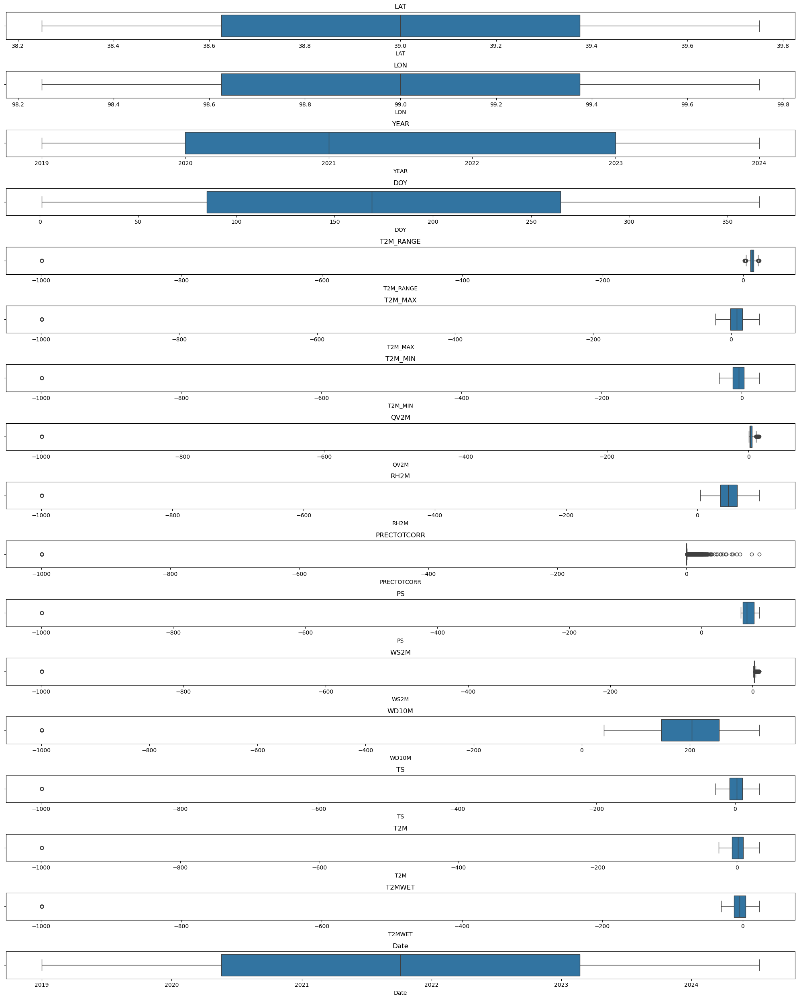

In [258]:
# Create subplots
fig, axes = plt.subplots(len(data.columns), figsize=(20, 25))

for i, col in enumerate(data.columns):
    sns.boxplot(data=data, x=col, ax=axes[i])
    axes[i].set_title(col)

plt.tight_layout()
plt.show()


### Capping outliers in T2M RAnge

In [259]:
## Capping outliers in the T2M_MAX column
Q1 = data['WS2M'].quantile(0.25)
Q3 = data['WS2M'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['WS2M']=np.where(data['WS2M']<lower_limit,lower_limit,data['WS2M'])
data['WS2M']=np.where(data['WS2M']>upper_limit,upper_limit,data['WS2M'])

## CAPPING OUTLIERS IN WD10M
Q1 = data['WD10M'].quantile(0.25)
Q3 = data['WD10M'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['WD10M']=np.where(data['WD10M']<lower_limit,lower_limit,data['WD10M'])
data['WD10M']=np.where(data['WD10M']>upper_limit,upper_limit,data['WD10M'])
## CAPPING OUTLIERS IN WD10M
## Capping outliers in the T2M_MAX column
Q1 = data['WD10M'].quantile(0.25)
Q3 = data['WD10M'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['WD10M']=np.where(data['WD10M']<lower_limit,lower_limit,data['WD10M'])
data['WD10M']=np.where(data['WD10M']>upper_limit,upper_limit,data['WD10M'])


## Capping outliers in the T2M_MAX column
Q1 = data['T2M_MAX'].quantile(0.25)
Q3 = data['T2M_MAX'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['T2M_MAX']=np.where(data['T2M_MAX']<lower_limit,lower_limit,data['T2M_MAX'])
data['T2M_MAX']=np.where(data['T2M_MAX']>upper_limit,upper_limit,data['T2M_MAX'])

## Capping outliers in the TS column
Q1 = data['TS'].quantile(0.25)
Q3 = data['TS'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['TS']=np.where(data['TS']<lower_limit,lower_limit,data['TS'])
data['TS']=np.where(data['TS']>upper_limit,upper_limit,data['TS'])

## CAPPING OUTLIERS IN T2M
Q1 = data['T2M'].quantile(0.25)
Q3 = data['T2M'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['T2M']=np.where(data['T2M']<lower_limit,lower_limit,data['T2M'])
data['T2M']=np.where(data['T2M']>upper_limit,upper_limit,data['T2M'])

## Capping outliers in the T2M_RANGE column
Q1 = data['T2M_RANGE'].quantile(0.25)
Q3 = data['T2M_RANGE'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['T2M_RANGE']=np.where(data['T2M_RANGE']<lower_limit,lower_limit,data['T2M_RANGE'])
data['T2M_RANGE']=np.where(data['T2M_RANGE']>upper_limit,upper_limit,data['T2M_RANGE'])

## Capping outliers in the 'PRECTOTCORR' column
Q1 = data['PRECTOTCORR'].quantile(0.25)
Q3 = data['PRECTOTCORR'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['PRECTOTCORR']=np.where(data['PRECTOTCORR']<lower_limit,lower_limit,data['PRECTOTCORR'])
data['PRECTOTCORR']=np.where(data['PRECTOTCORR']>upper_limit,upper_limit,data['PRECTOTCORR'])

## Capping outliers in the RH2M column
Q1 = data['RH2M'].quantile(0.25)
Q3 = data['RH2M'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['RH2M']=np.where(data['RH2M']<lower_limit,lower_limit,data['RH2M'])
data['RH2M']=np.where(data['RH2M']>upper_limit,upper_limit,data['RH2M'])

## Capping outliers in the QV2M column
Q1 = data['QV2M'].quantile(0.25)
Q3 = data['QV2M'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['QV2M']=np.where(data['QV2M']<lower_limit,lower_limit,data['QV2M'])
data['QV2M']=np.where(data['QV2M']>upper_limit,upper_limit,data['QV2M'])

## Capping outliers in the PS column
Q1 = data['PS'].quantile(0.25)
Q3 = data['PS'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['PS']=np.where(data['PS']<lower_limit,lower_limit,data['PS'])
data['PS']=np.where(data['PS']>upper_limit,upper_limit,data['PS'])

## Capping outliers in the T2M_WET column
Q1 = data['T2MWET'].quantile(0.25)
Q3 = data['T2MWET'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR
data['T2MWET']=np.where(data['T2MWET']<lower_limit,lower_limit,data['T2MWET'])
data['T2MWET']=np.where(data['T2MWET']>upper_limit,upper_limit,data['T2MWET'])


### Summary of data and distribution

In [260]:
data.describe()

,LAT,LON,YEAR,DOY,T2M_RANGE,T2M_MAX,T2M_MIN,QV2M,RH2M,PRECTOTCORR,PS,WS2M,WD10M,TS,T2M,T2MWET,Date
count,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288.000000,32288
mean,39.000000,99.000000,2021.284936,174.860753,12.726807,8.455646,-5.710437,3.211266,48.088593,0.170106,71.105393,2.440226,199.715179,1.780343,1.576487,-4.128835,2021-10-05 12:00:00
min,38.250000,98.250000,2019.000000,1.000000,3.980000,-26.950000,-999.000000,-4.485000,-2.910000,-0.405000,37.170000,0.505000,-12.620000,-36.573750,-32.250000,-36.970000,2019-01-01 00:00:00
25%,38.625000,98.625000,2020.000000,85.000000,10.550000,-0.760000,-12.520000,1.170000,35.220000,0.000000,62.520000,1.900000,147.497500,-8.220000,-7.260000,-12.340000,2020-05-19 00:00:00
50%,39.000000,99.000000,2021.000000,169.000000,12.770000,8.500000,-3.920000,2.290000,47.340000,0.000000,68.525000,2.290000,203.505000,2.120000,1.710000,-4.375000,2021-10-05 12:00:00
75%,39.375000,99.375000,2023.000000,265.000000,14.930000,16.700000,3.110000,4.940000,60.640000,0.270000,79.420000,2.830000,254.242500,10.682500,9.400000,4.080000,2023-02-22 00:00:00
max,39.750000,99.750000,2024.000000,366.000000,21.500000,40.670000,24.980000,10.595000,94.210000,0.675000,87.390000,4.225000,328.220000,34.510000,32.060000,23.550000,2024-07-10 00:00:00
std,0.559026,0.559026,1.607608,104.857351,3.066266,11.715841,39.927532,2.486302,16.839831,0.264540,8.784701,0.743518,60.768155,12.636707,11.602718,10.459292,NaN


#### Dat after capping outliers

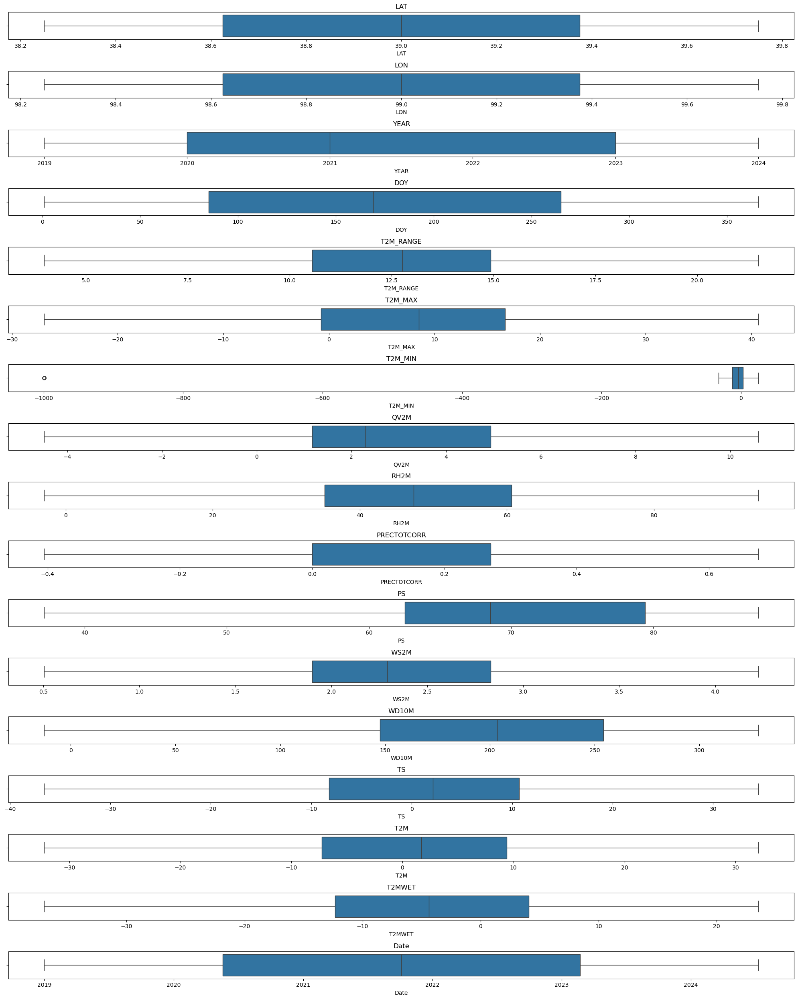

In [261]:
# Create subplots
fig, axes = plt.subplots(len(data.columns), figsize=(20, 25))

for i, col in enumerate(data.columns):
    sns.boxplot(data=data, x=col, ax=axes[i])
    axes[i].set_title(col)

plt.tight_layout()
plt.show()


In [262]:
dates=data['Date']


## EDA

###  Correlation heatmap

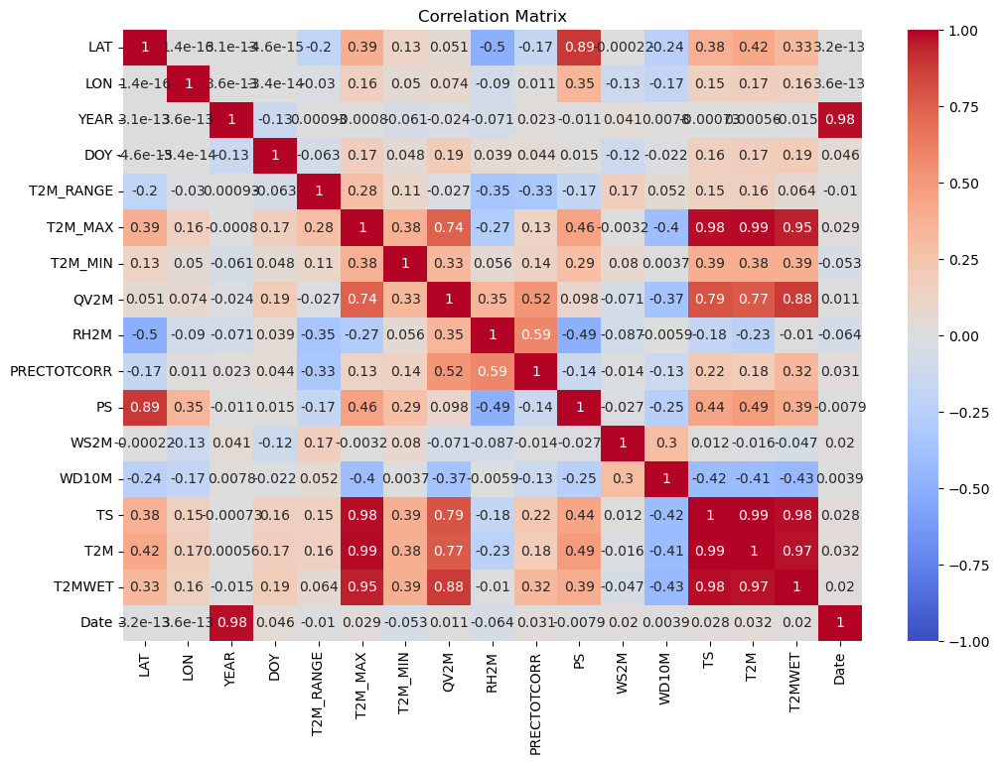

In [263]:
plt.figure(figsize=(12, 8))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


### Distribution of some of temperature variables

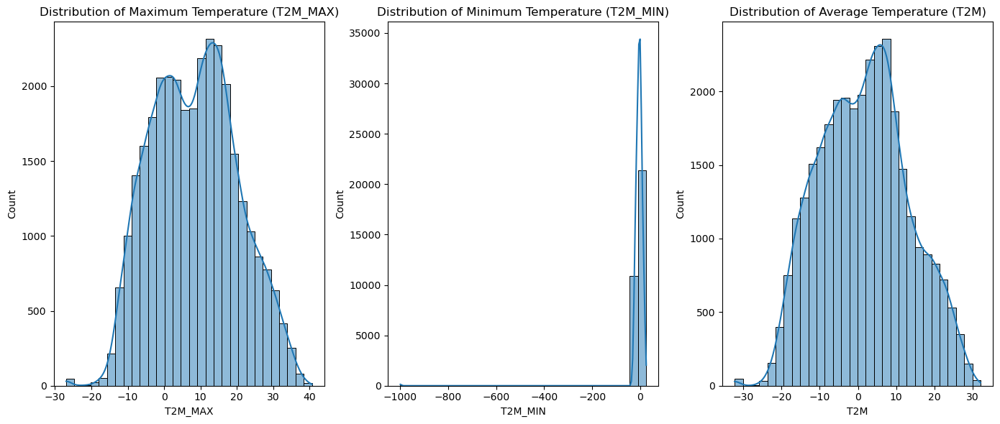

In [126]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 3, 1)
sns.histplot(data['T2M_MAX'], bins=30, kde=True)
plt.title('Distribution of Maximum Temperature (T2M_MAX)')

plt.subplot(1, 3, 2)
sns.histplot(data['T2M_MIN'], bins=30, kde=True)
plt.title('Distribution of Minimum Temperature (T2M_MIN)')

plt.subplot(1, 3, 3)
sns.histplot(data['T2M'], bins=30, kde=True)
plt.title('Distribution of Average Temperature (T2M)')

plt.tight_layout()
plt.show()


### Pairplot shows how columns are correlated with eachother

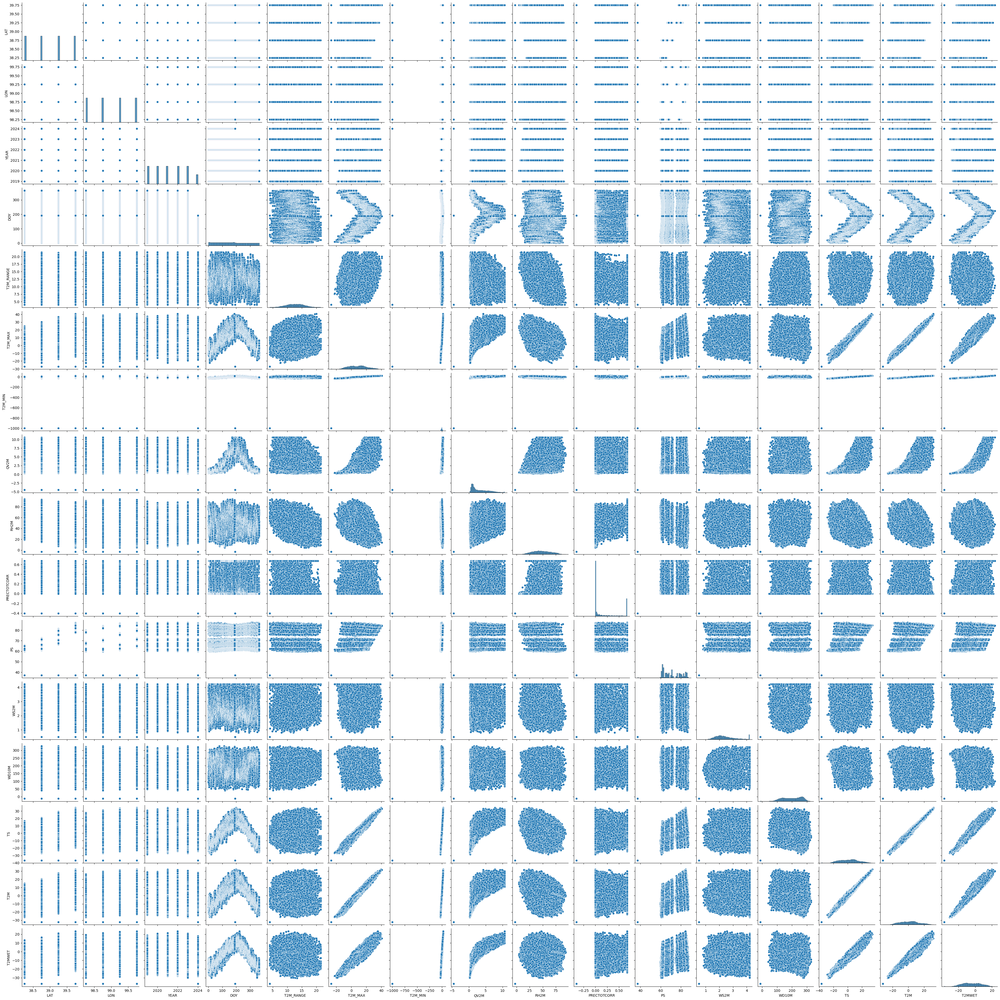

In [20]:
# Pairplot
sns.pairplot(data)
plt.show()


###  Boxplot for temperature vs. other climatic features

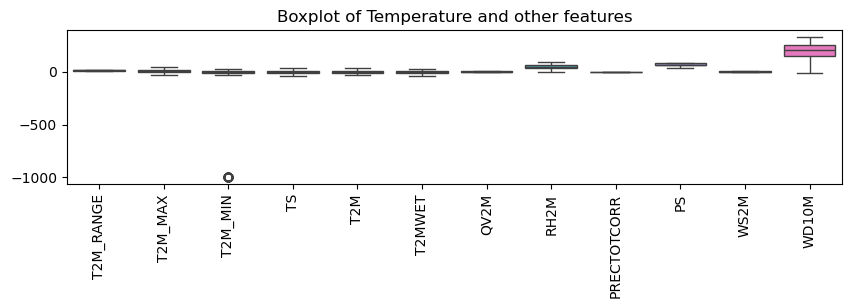

In [127]:
plt.figure(figsize=(10, 2))
sns.boxplot(data=data[['T2M_RANGE', 'T2M_MAX', 'T2M_MIN','TS', 'T2M',
                       'T2MWET', 'QV2M','RH2M', 'PRECTOTCORR', 'PS', 
                       'WS2M', 'WD10M']])
plt.xticks(rotation=90)
plt.title('Boxplot of Temperature and other features')
plt.show()


### Temperature vs. Humidity

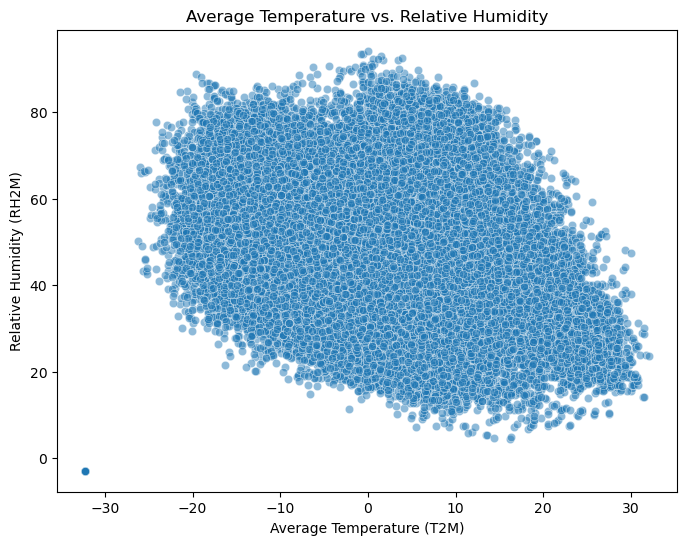

In [128]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='T2M', y='RH2M', alpha=0.5)
plt.title('Average Temperature vs. Relative Humidity')
plt.xlabel('Average Temperature (T2M)')
plt.ylabel('Relative Humidity (RH2M)')
plt.show()


### Temperature vs. Precipitation

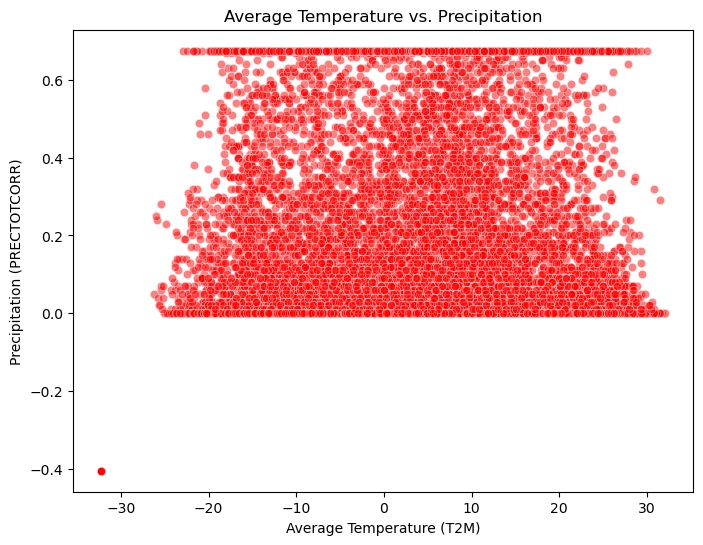

In [129]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='T2M', y='PRECTOTCORR', alpha=0.5,color='red')
plt.title('Average Temperature vs. Precipitation')
plt.xlabel('Average Temperature (T2M)')
plt.ylabel('Precipitation (PRECTOTCORR)')
plt.show()


### Temperature Trends Over Time

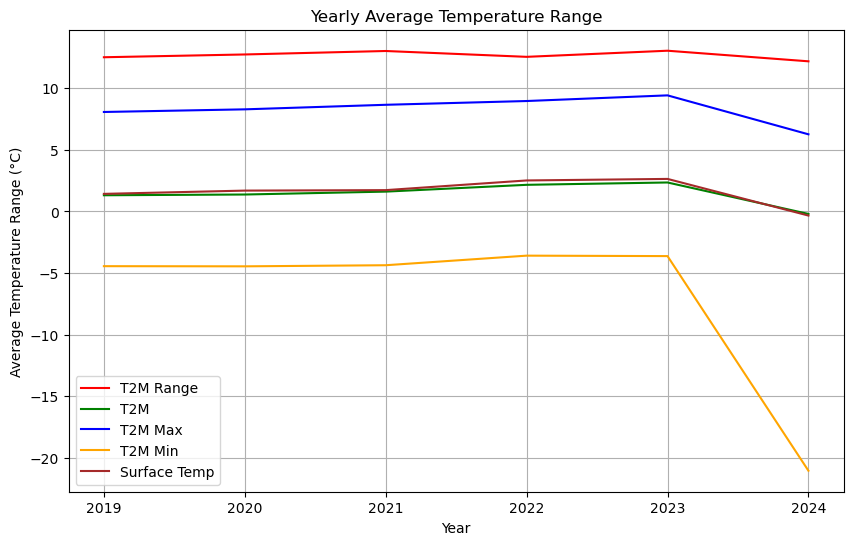

In [264]:
data['YEAR'] = data['Date'].dt.year
yearly_temp_range = data.groupby('YEAR')['T2M_RANGE'].mean().reset_index()
yearly_t2m=data.groupby('YEAR')['T2M'].mean().reset_index()
yearly_tmp_min=data.groupby('YEAR')['T2M_MIN'].mean().reset_index()
yearly_tmp_max=data.groupby('YEAR')['T2M_MAX'].mean().reset_index()
yearly_surface_temp=data.groupby('YEAR')['TS'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.lineplot(data=yearly_temp_range, x='YEAR', y='T2M_RANGE',color='red',label='T2M Range')
sns.lineplot(data=yearly_t2m, x='YEAR', y='T2M',color='green',label='T2M')
sns.lineplot(data=yearly_tmp_max, x='YEAR', y='T2M_MAX',color='blue',label='T2M Max')
sns.lineplot(data=yearly_tmp_min, x='YEAR', y='T2M_MIN',color='orange',label='T2M Min')
sns.lineplot(data=yearly_surface_temp, x='YEAR', y='TS',color='brown',label='Surface Temp')
plt.legend()
plt.grid()
plt.title('Yearly Average Temperature Range')
plt.xlabel('Year')
plt.ylabel('Average Temperature Range (°C)')
plt.show()


### How precipitation varies over time

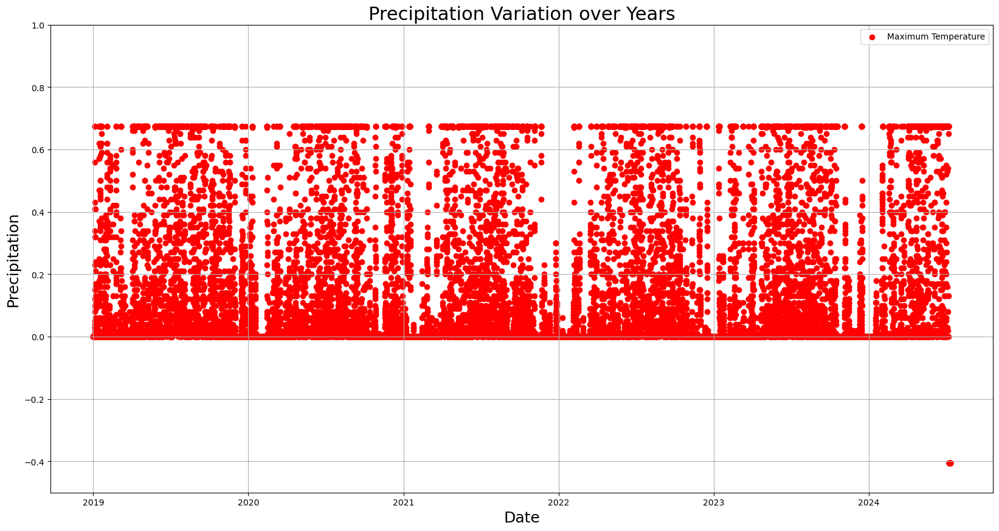

In [265]:
plt.figure(figsize=(20,10))
plt.scatter(data['Date'],data['PRECTOTCORR'],color='red',label='Maximum Temperature')
# plt.scatter(data['Date'],data['T2M_MIN'],color='teal',label='Minimum Temperature')
plt.xlabel("Date",fontsize=18)
plt.ylabel("Precipitation",fontsize=18)
plt.grid()
plt.legend()
plt.ylim(-0.5, 1) 
plt.title("Precipitation Variation over Years",fontsize=22)
plt.show()

### Minimun and Maximum Temperature Variation over Years

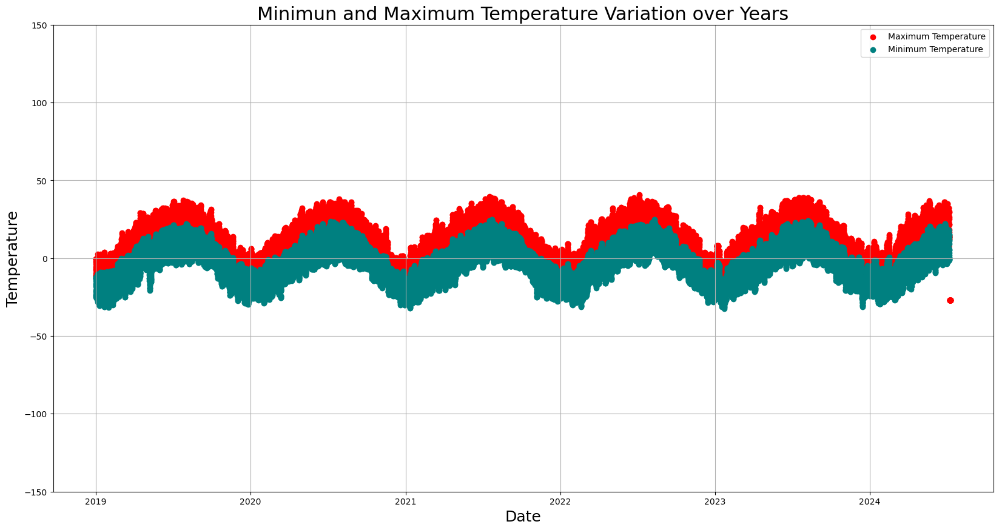

In [266]:
plt.figure(figsize=(20,10))
plt.scatter(data['Date'],data['T2M_MAX'],color='red',label='Maximum Temperature')
plt.scatter(data['Date'],data['T2M_MIN'],color='teal',label='Minimum Temperature')
plt.xlabel("Date",fontsize=18)
plt.ylabel("Temperature",fontsize=18)
plt.grid()
plt.legend()
plt.ylim(-150, 150) 
plt.title("Minimun and Maximum Temperature Variation over Years",fontsize=22)
plt.show()

### Seasonal Temperature Variation

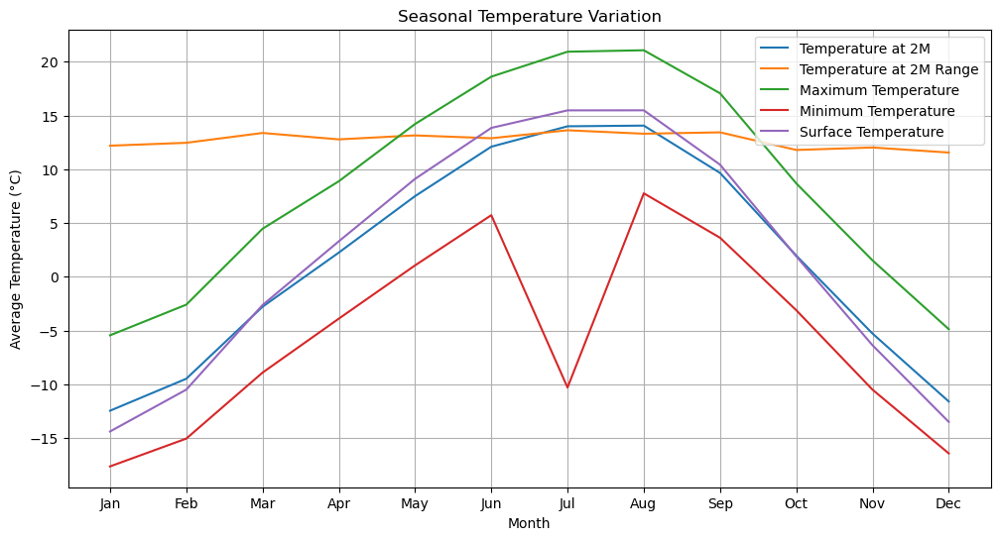

In [267]:
data['MONTH'] = data['Date'].dt.month

seasonal_temp = data.groupby('MONTH')['T2M'].mean().reset_index()
seasonal_temp_range = data.groupby('MONTH')['T2M_RANGE'].mean().reset_index()
seasonal_temp_max = data.groupby('MONTH')['T2M_MAX'].mean().reset_index()
seasonal_temp_min = data.groupby('MONTH')['T2M_MIN'].mean().reset_index()
seasonal_temp_surface = data.groupby('MONTH')['TS'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=seasonal_temp, x='MONTH', y='T2M',label="Temperature at 2M")
sns.lineplot(data=seasonal_temp_range, x='MONTH', y='T2M_RANGE',label='Temperature at 2M Range')
sns.lineplot(data=seasonal_temp_max, x='MONTH', y='T2M_MAX',label='Maximum Temperature')
sns.lineplot(data=seasonal_temp_min, x='MONTH', y='T2M_MIN',label='Minimum Temperature')
sns.lineplot(data=seasonal_temp_surface, x='MONTH', y='TS',label='Surface Temperature')
plt.title('Seasonal Temperature Variation')
plt.xlabel('Month')
plt.ylabel('Average Temperature (°C)')
plt.grid()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


## Feature engineering

In [268]:
#Extracting Day Month and year bcz machine learning models cant be trained on date col
data['Year']=data['Date'].dt.year
data['Month']=data['Date'].dt.month
data['Day']=data['Date'].dt.day


#### Dropping un-necessary columns from the dataset

In [269]:
## Keeping copy of data for LSTM
df=data.copy()
## droping date column
data.drop(['Date','MONTH'],axis=1,inplace=True)

### Arranging temperature columns on one side and other features on other side

In [270]:
data=data[['LAT','LON','YEAR','DOY','Year','Month','Day','T2M_RANGE','T2M_MAX','T2M_MIN','TS','T2M','T2MWET','QV2M',
           'RH2M','PRECTOTCORR','PS','WS2M','WD10M']]

In [271]:
data

,LAT,LON,YEAR,DOY,Year,Month,Day,T2M_RANGE,T2M_MAX,T2M_MIN,TS,T2M,T2MWET,QV2M,RH2M,PRECTOTCORR,PS,WS2M,WD10M
0,38.25,98.25,2019,1,2019,1,1,13.45,-11.61,-25.07,-21.67000,-20.06,-21.12,0.890,82.29,0.000,60.69,3.480,259.46
1,38.25,98.75,2019,1,2019,1,1,13.19,-11.34,-24.54,-20.54000,-19.44,-20.72,0.890,79.72,0.000,60.85,3.550,261.44
2,38.25,99.25,2019,1,2019,1,1,14.01,-9.90,-23.91,-19.51000,-18.31,-20.00,0.910,75.09,0.000,62.10,3.270,262.46
3,38.25,99.75,2019,1,2019,1,1,14.27,-7.23,-21.50,-17.08000,-15.60,-18.28,0.930,64.30,0.000,64.79,2.630,250.68
4,38.75,98.25,2019,1,2019,1,1,12.79,-10.89,-23.68,-20.15000,-18.67,-20.19,0.890,76.70,0.000,61.91,3.060,251.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3067,39.25,99.75,2024,192,2024,7,10,3.98,-26.95,-999.00,-36.57375,-32.25,-36.97,-4.485,-2.91,-0.405,37.17,0.505,-12.62
3068,39.75,98.25,2024,192,2024,7,10,3.98,-26.95,-999.00,-36.57375,-32.25,-36.97,-4.485,-2.91,-0.405,37.17,0.505,-12.62
3069,39.75,98.75,2024,192,2024,7,10,3.98,-26.95,-999.00,-36.57375,-32.25,-36.97,-4.485,-2.91,-0.405,37.17,0.505,-12.62
3070,39.75,99.25,2024,192,2024,7,10,3.98,-26.95,-999.00,-36.57375,-32.25,-36.97,-4.485,-2.91,-0.405,37.17,0.505,-12.62


### Dropping some of the features

In [272]:
data.drop(['WS2M','DOY','YEAR','WD10M','QV2M','LAT','LON'],axis=1,inplace=True)

In [273]:
data.head()

,Year,Month,Day,T2M_RANGE,T2M_MAX,T2M_MIN,TS,T2M,T2MWET,RH2M,PRECTOTCORR,PS
0,2019,1,1,13.45,-11.61,-25.07,-21.67,-20.06,-21.12,82.29,0.0,60.69
1,2019,1,1,13.19,-11.34,-24.54,-20.54,-19.44,-20.72,79.72,0.0,60.85
2,2019,1,1,14.01,-9.90,-23.91,-19.51,-18.31,-20.00,75.09,0.0,62.10
3,2019,1,1,14.27,-7.23,-21.50,-17.08,-15.60,-18.28,64.30,0.0,64.79
4,2019,1,1,12.79,-10.89,-23.68,-20.15,-18.67,-20.19,76.70,0.0,61.91


### Seperating the matrix of features and dependent variable vector

In [274]:
x=data.drop([ 'RH2M', 'PRECTOTCORR', 'PS'],axis=1)
y=data.iloc[:,-4:]

### Splitting the data into train and test

In [275]:
##splitting dataset into train and test split 80-20
training_size=int(len(x)*0.80)
x_train,x_test=x.iloc[:training_size,:],x.iloc[training_size:,:]
y_train,y_test=y.iloc[:training_size],y.iloc[training_size:]

In [277]:
cols=x_train.columns

### Shape of x_train and test

In [38]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(25830, 9)
(6458, 9)
(25830, 4)
(6458, 4)


### Scaling features


In [39]:
from sklearn.preprocessing import StandardScaler

In [40]:
scaler = StandardScaler()
X_train_sc = scaler.fit_transform(x_train)
X_test_sc=scaler.transform(x_test)

### Specifying the parameters for the Random Forest Regressor

In [41]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.neural_network import MLPRegressor

In [42]:
# Random Forest
rf = RandomForestRegressor(n_estimators=100,random_state=42)

### Training RandomForest Regressor

In [43]:
rf.fit(X_train_sc, y_train)

## prediction
y_pred_rf = rf.predict(X_test_sc)

### Evaluating Random Forest regressor

In [44]:
mae = mean_absolute_error(y_test, y_pred_rf)
print('mae:', mae)
#mse
mse = mean_squared_error(y_test, y_pred_rf)
print('mse:', mse)
#rmse
rmse = np.sqrt(mse)
print('rmse:', rmse)
# r2-score
r_squared = r2_score(y_test, y_pred_rf)
print('r2_score:', r_squared)

mae: 1.4696115980179627
mse: 15.030700468916844
rmse: 3.8769447337970715
r2_score: 0.8012960333952324


## important features that have strong relationship with climate change variable

In [286]:
importance=rf.feature_importances_
di={}
for i in range(len(importance)):
    di[cols[i]]=importance[i]

In [287]:
di

{'Year': 0.005597933762239433,
 'Month': 0.0625240699672241,
 'Day': 0.007824154716929644,
 'T2M_RANGE': 0.019406803263652354,
 'T2M_MAX': 0.21925165648299083,
 'T2M_MIN': 0.21058791345482222,
 'TS': 0.012991765337028262,
 'T2M': 0.13047786924477506,
 'T2MWET': 0.3313378337703382}

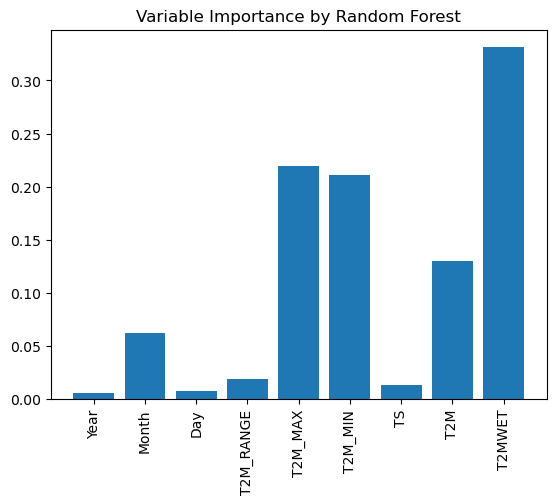

In [295]:
plt.bar(x=di.keys(),height=di.values())
plt.title("Variable Importance by Random Forest")
plt.xticks(rotation=90)
plt.show()

### Specifying Parameters for  for decision tree

In [45]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor(max_depth=12,random_state=42)

In [46]:
dtr.fit(X_train_sc, y_train)

## prediction
y_pred_dtr = dtr.predict(X_test_sc)

In [47]:
mae = mean_absolute_error(y_test, y_pred_dtr)
print('mae:', mae)
#mse
mse = mean_squared_error(y_test, y_pred_dtr)
print('mse:', mse)
#rmse
rmse = np.sqrt(mse)
print('rmse:', rmse)
# r2-score
r_squared = r2_score(y_test, y_pred_dtr)
print('r2_score:', r_squared)

mae: 2.0214217093824165
mse: 18.283786030413214
rmse: 4.275954399945492
r2_score: 0.7513648835348359


### Evaluating Ridge model

In [48]:
rg=Ridge(alpha=1)
rg.fit(X_train_sc, y_train)

## prediction
y_pred_rg = rg.predict(X_test_sc)

In [49]:
mae = mean_absolute_error(y_test, y_pred_rg)
print('mae:', mae)
#mse
mse = mean_squared_error(y_test, y_pred_rg)
print('mse:', mse)
#rmse
rmse = np.sqrt(mse)
print('rmse:', rmse)
# r2-score
r_squared = r2_score(y_test, y_pred_rg)
print('r2_score:', r_squared)

mae: 2.817921941851872
mse: 309.489858060688
rmse: 17.5923238391262
r2_score: -0.8075704343550648


## Preparing data for LSTM model

In [165]:
df.head()

,LAT,LON,YEAR,DOY,T2M_RANGE,T2M_MAX,T2M_MIN,QV2M,RH2M,PRECTOTCORR,...,WS2M,WD10M,TS,T2M,T2MWET,Date,MONTH,Year,Month,Day
0,38.25,98.25,2019,1,13.45,-11.61,-25.07,0.89,82.29,0.0,...,3.48,259.46,-21.67,-20.06,-21.12,2019-01-01,1,2019,1,1
1,38.25,98.75,2019,1,13.19,-11.34,-24.54,0.89,79.72,0.0,...,3.55,261.44,-20.54,-19.44,-20.72,2019-01-01,1,2019,1,1
2,38.25,99.25,2019,1,14.01,-9.90,-23.91,0.91,75.09,0.0,...,3.27,262.46,-19.51,-18.31,-20.00,2019-01-01,1,2019,1,1
3,38.25,99.75,2019,1,14.27,-7.23,-21.50,0.93,64.30,0.0,...,2.63,250.68,-17.08,-15.60,-18.28,2019-01-01,1,2019,1,1
4,38.75,98.25,2019,1,12.79,-10.89,-23.68,0.89,76.70,0.0,...,3.06,251.96,-20.15,-18.67,-20.19,2019-01-01,1,2019,1,1


In [166]:
df.columns

Index(['LAT', 'LON', 'YEAR', 'DOY', 'T2M_RANGE', 'T2M_MAX', 'T2M_MIN', 'QV2M',
       'RH2M', 'PRECTOTCORR', 'PS', 'WS2M', 'WD10M', 'TS', 'T2M', 'T2MWET',
       'Date', 'MONTH', 'Year', 'Month', 'Day'],
      dtype='object')

### Dropping some of the columns

In [167]:
df.drop(['LAT','LON','YEAR','DOY','Month','MONTH','Day','Year','WD10M','WS2M','QV2M'],axis=1,inplace=True)

### Rearranging columns

In [168]:
df.columns

Index(['T2M_RANGE', 'T2M_MAX', 'T2M_MIN', 'RH2M', 'PRECTOTCORR', 'PS', 'TS',
       'T2M', 'T2MWET', 'Date'],
      dtype='object')

In [169]:
df=df[[ 'Date','T2M_RANGE', 'T2M_MAX', 'T2M_MIN','T2M', 'T2MWET', 'RH2M', 'PRECTOTCORR', 'PS']]

In [170]:
df

,Date,T2M_RANGE,T2M_MAX,T2M_MIN,T2M,T2MWET,RH2M,PRECTOTCORR,PS
0,2019-01-01,13.45,-11.61,-25.07,-20.06,-21.12,82.29,0.000,60.69
1,2019-01-01,13.19,-11.34,-24.54,-19.44,-20.72,79.72,0.000,60.85
2,2019-01-01,14.01,-9.90,-23.91,-18.31,-20.00,75.09,0.000,62.10
3,2019-01-01,14.27,-7.23,-21.50,-15.60,-18.28,64.30,0.000,64.79
4,2019-01-01,12.79,-10.89,-23.68,-18.67,-20.19,76.70,0.000,61.91
...,...,...,...,...,...,...,...,...,...
3067,2024-07-10,3.98,-26.95,-999.00,-32.25,-36.97,-2.91,-0.405,37.17
3068,2024-07-10,3.98,-26.95,-999.00,-32.25,-36.97,-2.91,-0.405,37.17
3069,2024-07-10,3.98,-26.95,-999.00,-32.25,-36.97,-2.91,-0.405,37.17
3070,2024-07-10,3.98,-26.95,-999.00,-32.25,-36.97,-2.91,-0.405,37.17


#### creating future matrix and dpendent matrix

In [176]:
df.set_index('Date',inplace=True)

### Splitting the data into train and test


In [177]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df.values)

In [178]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(25830, 5)
(6458, 5)
(25830, 3)
(6458, 3)


### Splitting the data into train and test

In [189]:
training_data_len = int(np.ceil(0.8 * len(df)))
train_data = scaled_data[0:training_data_len, :]
x_train = []
y_train = []
for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, :5])
    y_train.append(train_data[i, 5:])
x_train, y_train = np.array(x_train), np.array(y_train)

### Reshape the training data to the required format

In [190]:
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], x_train.shape[2]))

In [191]:
x_train.shape

(25771, 60, 5)

In [192]:
y_train.shape

(25771, 3)

### Reshape the testing data to the required format

In [203]:
test_data = scaled_data[training_data_len - 60:, :]
x_test = []
y_test=[]
# y_test = data.iloc[training_data_len:, 5:]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, :5])
    y_test.append(train_data[i, 5:])
x_test,y_test = np.array(x_test),np.array(y_test)
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], x_test.shape[2]))

In [204]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(25771, 60, 5)
(6457, 60, 5)
(25771, 3)
(6457, 3)


### Define the LSTM model

In [205]:
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dense(units=25))
model.add(Dense(units=3))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 60, 50)            11200     
                                                                 
 lstm_11 (LSTM)              (None, 50)                20200     
                                                                 
 dense_10 (Dense)            (None, 25)                1275      
                                                                 
 dense_11 (Dense)            (None, 3)                 78        
                                                                 
Total params: 32753 (127.94 KB)
Trainable params: 32753 (127.94 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


### Training our Lstm Model

In [206]:
history=model.fit(x_train, y_train, batch_size=32, epochs=10)

Epoch 1/10
806/806 [==============================] - 55s 59ms/step - loss: 0.0268
Epoch 2/10
806/806 [==============================] - 90s 112ms/step - loss: 0.0166
Epoch 3/10
806/806 [==============================] - 33s 41ms/step - loss: 0.0141
Epoch 4/10
806/806 [==============================] - 32s 39ms/step - loss: 0.0133
Epoch 5/10
806/806 [==============================] - 33s 41ms/step - loss: 0.0128
Epoch 6/10
806/806 [==============================] - 32s 40ms/step - loss: 0.0124
Epoch 7/10
806/806 [==============================] - 31s 38ms/step - loss: 0.0122
Epoch 8/10
806/806 [==============================] - 31s 38ms/step - loss: 0.0119
Epoch 9/10
806/806 [==============================] - 32s 39ms/step - loss: 0.0118
Epoch 10/10
806/806 [==============================] - 32s 40ms/step - loss: 0.0116



#### visualizing how mean_squared error and loss varies in each epoch

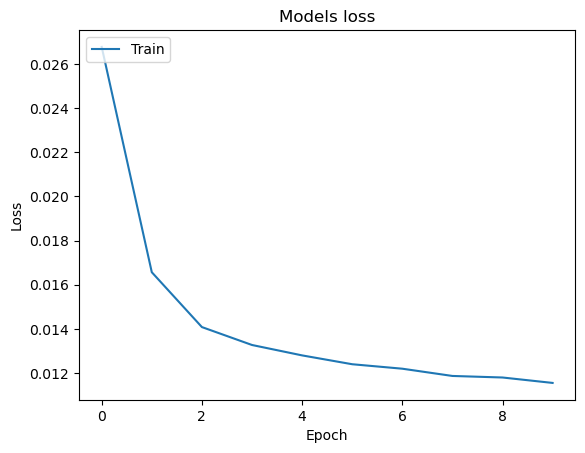

In [208]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.title('Models loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

#### Performing prediction and check performance metrics

In [209]:
### prediction on training data
train_predict1=model.predict(x_train)

### prediction on testing data
test_predict1=model.predict(x_test)

202/202 [==============================] - 3s 16ms/step


In [215]:
train_predict1.shape

(25771, 3)

### Visualizing the actual and predicted climate results

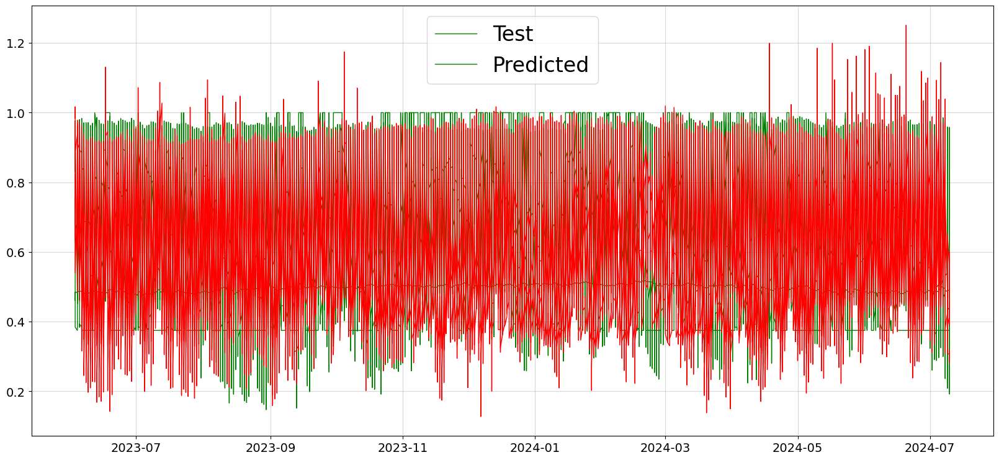

In [224]:
plt.figure(figsize=(20,9))
plt.plot(all_dates[-6457:],y_test , 'g', linewidth=1)
plt.plot(dates[-6457:],test_predict1,'r' , linewidth=1)
plt.legend(('Test','Predicted'),fontsize=24)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(alpha=0.5)
plt.show()

### Evaluation of LSTM model

In [226]:
### Calculate RMSE performance metrics
mae = mean_absolute_error(y_test,test_predict1)
print('mae:', mae)
#mse
mse = mean_squared_error(y_test,test_predict1)
print('mse:', mse)
#rmse
rmse = np.sqrt(mse)
print('rmse:', rmse)
# r2-score
r_squared = r2_score(y_test, test_predict1)
print('r2_score:', r_squared)


mae: 0.24212893415978584
mse: 0.0869963936137751
rmse: 0.2949515106144993
r2_score: -1.2783784436204921


### predictied climate results

In [229]:
test_predict1

array([[0.8233662 , 0.98353595, 0.6375828 ],
       [0.7739108 , 0.9505184 , 0.6699634 ],
       [0.76917607, 0.9923204 , 0.7257911 ],
       ...,
       [0.3960703 , 0.281915  , 0.5749581 ],
       [0.38985336, 0.28406066, 0.6001444 ],
       [0.4072643 , 0.30007648, 0.55386025]], dtype=float32)

In [232]:
train_predict1

array([[0.6841797 , 0.5334985 , 0.87916887],
       [0.6916196 , 0.5478066 , 0.92776173],
       [0.7176234 , 0.5748937 , 0.96998626],
       ...,
       [0.85949194, 0.9085525 , 0.5432964 ],
       [0.85686404, 0.9435665 , 0.5699859 ],
       [0.8519564 , 0.98231506, 0.6053488 ]], dtype=float32)

### out of all model randomForest model provided best results